## Overview
This notebook captures the exploratory data analysis that you can perform on images. Right now it is driven by an Image Classification scenario however in future this will be extended to other scenarios as well.

### Setup Environment
Here are the commands that can be used to setup the environment required for executing this notebook. Make sure you have python version 3.9.0 or higher

In [1]:
# !pip install torch
# !pip install torchvision
# !pip install opencv-python
# !pip install matplotlib
# !pip install pandas
# !pip install scipy
# !pip install sklearn

In [1]:
# import the required packages 
import os
import cv2
import glob
import torch
import numpy
import pandas
import scipy.fftpack
from PIL import Image
from random import sample 
from collections import Counter
import matplotlib.pyplot as plt
from scipy.spatial import distance
from torch.utils.data import Subset
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Dataset

In [3]:
# define important variables
IMAGE_DIR = './images/train/'
FILE_TYPE = '.JPG'
BATCH_SIZE = 64
HASH_SIZE = 8
HIGHFREQ_FACTOR = 4

In [4]:
# create the crop dataset class for this example reading files from a local folder
class CropDataset(Dataset):
    def __init__(self, file_path, transform=None):
        xform = transforms.Compose([transforms.ToTensor()]) if transform is None else transform
        self.img_dataset = datasets.ImageFolder(file_path, transform=xform)

    def __len__(self):
        return len(self.img_dataset)

    def __getitem__(self, idx):
        image, label = self.img_dataset[idx]
        return image, label
    
    # this is an experimental method created to explore how the dunder methods can be modified
    def __repr__(self, idx=0):
        image, label = self.img_dataset[idx]
        plt.imshow(image.permute(1,2,0))
        return str("Display view of the image")

### Image Size & Channel
Check if the image size and channel are consistent in the data. This will help in deciding we have any resizing needs in the data. You should also think if the RGB image is really required for your scenario, if not converting it to Grey Scale may be better

In [5]:
# read all the images and extract the shape (height * width * channel) and plot the distribution of each
def get_image_properties(image_path, file_type='.JPG'):  
    img_by_class = {}
    img_attr_by_class = {}
    dirs = os.listdir(IMAGE_DIR)
    for d in dirs:
        if d == '.DS_Store':
            pass
        else:
            img = []
            img_attr = []
            files = [file for file in glob.glob(image_path + d + '/**', recursive=True) if file.endswith(file_type)]
            for file in files:
                image = cv2.imread(file)
                img.append(numpy.array(image))
                img_attr.append(image.shape)
            img_by_class[d] = img
            img_attr_by_class[d] = img_attr
    return img_by_class, img_attr_by_class

In [6]:
images, properties = get_image_properties(IMAGE_DIR, FILE_TYPE)

#### Distribution of Height of Images

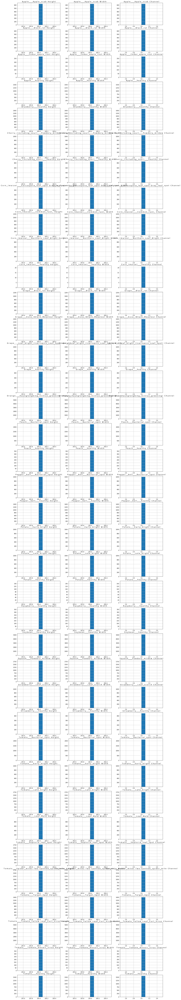

In [7]:
descDict = {0:'Height', 1:'Width', 2:'Channel'}
fig, axes = plt.subplots(figsize=(20,140), nrows=len(properties.keys()), ncols=3)
for i, key in enumerate(sorted(properties.keys())):
    for j in range(3):
        pandas.DataFrame(properties[key])[j].hist(ax=axes[i][j])
        axes[i][j].title.set_text(' '.join('%5s' % key + ' ' + descDict[j]))

### Class Distribution
Check if the training images are equally balanced across the classes

In [8]:
crop = CropDataset(IMAGE_DIR)

<AxesSubplot:xlabel='class'>

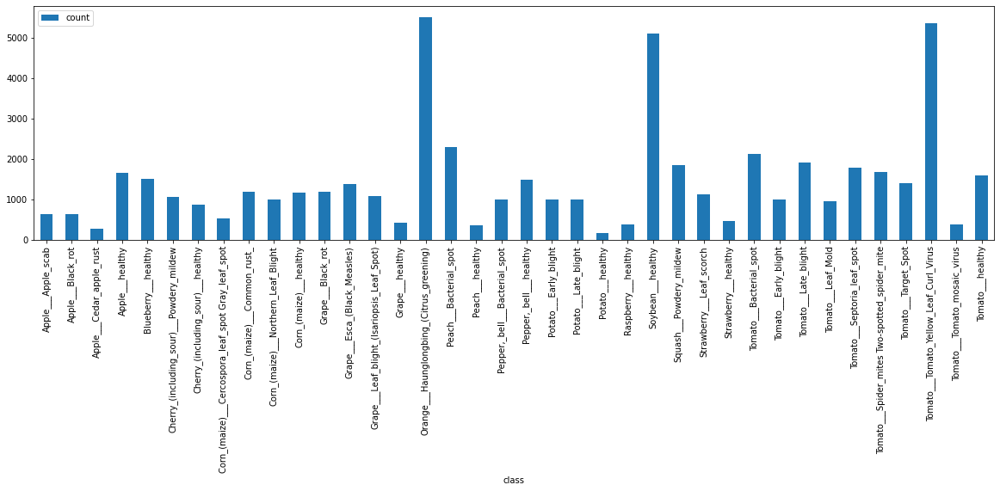

In [9]:
img_class = pandas.DataFrame(crop.img_dataset.class_to_idx, 
                 index=['class_id']).transpose().reset_index().rename(columns={'index':'class'})

img_count = pandas.DataFrame(dict(Counter(crop.img_dataset.targets)), 
                 index=['count']).transpose().reset_index().rename(columns={'index':'class_id'})

img_class.merge(img_count, on=['class_id'], how='inner').plot.bar(x='class', y='count', figsize=(20,5))

### Duplicate Images

In [10]:
def phash(image, hash_size=8, highfreq_factor=4):
    """
    Perceptual Hash computation.
    Implementation follows http://www.hackerfactor.com/blog/index.php?/archives/432-Looks-Like-It.html
    @image must be a PIL instance.
    """
    if hash_size < 2:
        raise ValueError("Hash size must be greater than or equal to 2")

    img_size = hash_size * highfreq_factor
    image = image.convert("L").resize((img_size, img_size), Image.ANTIALIAS)
    pixels = numpy.asarray(image)
    dct = scipy.fftpack.dct(scipy.fftpack.dct(pixels, axis=0), axis=1)
    dctlowfreq = dct[:hash_size, :hash_size]
    med = numpy.median(dctlowfreq)
    diff = dctlowfreq > med
    
    return diff

In [11]:
def get_duplicate_images(image_path, file_type='.JPG', hash_size=8, highfreq_factor=4):
    # get the phash of all the images one by one. This method can be optimized to run in parallel
    files = [file for file in glob.glob(image_path + '**', recursive=True) if file.endswith(file_type)]
    p_hash = [phash(Image.open(file), hash_size, highfreq_factor).reshape(hash_size*hash_size) for file in files]

    # create a matrix of n * n where n represents the total number of images
    # get the index of the upper triangular matrix to be used for populating the hamming distance between each image
    n = len(files) - 1
    idx = torch.triu_indices(n,n)

    # find the hamming distance between the images and populate the upper triangular matrix with that distance
    distance = torch.nn.functional.pdist(torch.Tensor(numpy.array(p_hash)), p=2)
    matrix = torch.ones((n, n))
    matrix[idx[0], idx[1]] = distance

    # find the index tuples for the images that are duplicate
    duplicate = (matrix == 0).nonzero().tolist()
    
    pair = []
    for i in duplicate:
        pair.append([files[i[0]:i[0] + 1][0], files[i[1] + 1:i[1] + 2][0]])
    
    return pair


In [12]:
dup = get_duplicate_images(IMAGE_DIR, FILE_TYPE)

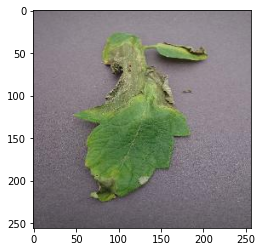

In [13]:
plt.imshow(Image.open(dup[0][0]))

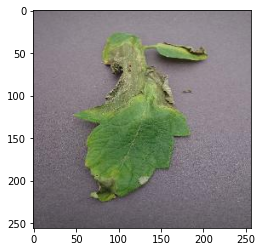

In [14]:
plt.imshow(Image.open(dup[0][1]))

### Image Color Distribution

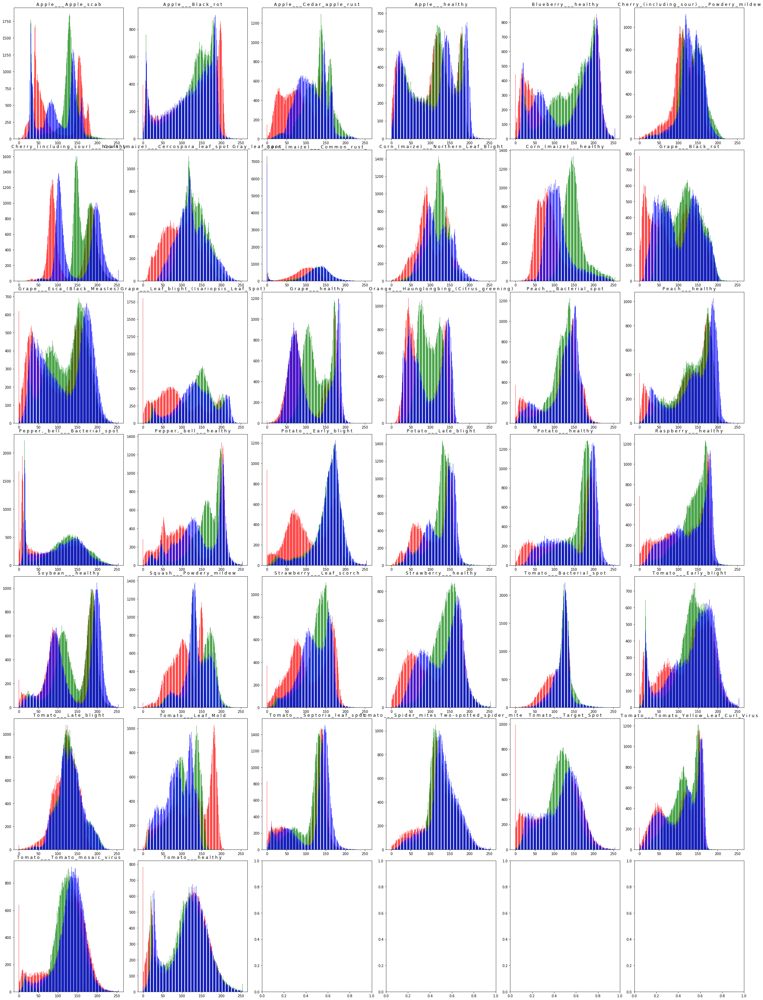

In [15]:
nb_bins = 256
count_r = numpy.zeros(nb_bins)
count_g = numpy.zeros(nb_bins)
count_b = numpy.zeros(nb_bins)
i = 0

ROWS = 7
COLS = 6

fig, axes = plt.subplots(figsize=(30,40), nrows=ROWS, ncols=COLS)
fig.tight_layout() 
dirs = os.listdir(IMAGE_DIR)
for j, key in enumerate(sorted(images.keys())):
    j = j%COLS
    x = images[key][0].transpose(2, 0, 1)
    hist_r = numpy.histogram(x[0], bins=nb_bins, range=[0, 255])
    hist_g = numpy.histogram(x[1], bins=nb_bins, range=[0, 255])
    hist_b = numpy.histogram(x[2], bins=nb_bins, range=[0, 255])

    bins = hist_r[1]
    axes[i][j].bar(bins[:-1], hist_r[0], color='r', alpha=0.7)
    axes[i][j].bar(bins[:-1], hist_g[0], color='g', alpha=0.7)
    axes[i][j].bar(bins[:-1], hist_b[0], color='b', alpha=0.7)
    axes[i][j].title.set_text(' '.join('%5s' % key ))
    i = i + 1 if j == COLS-1 else i

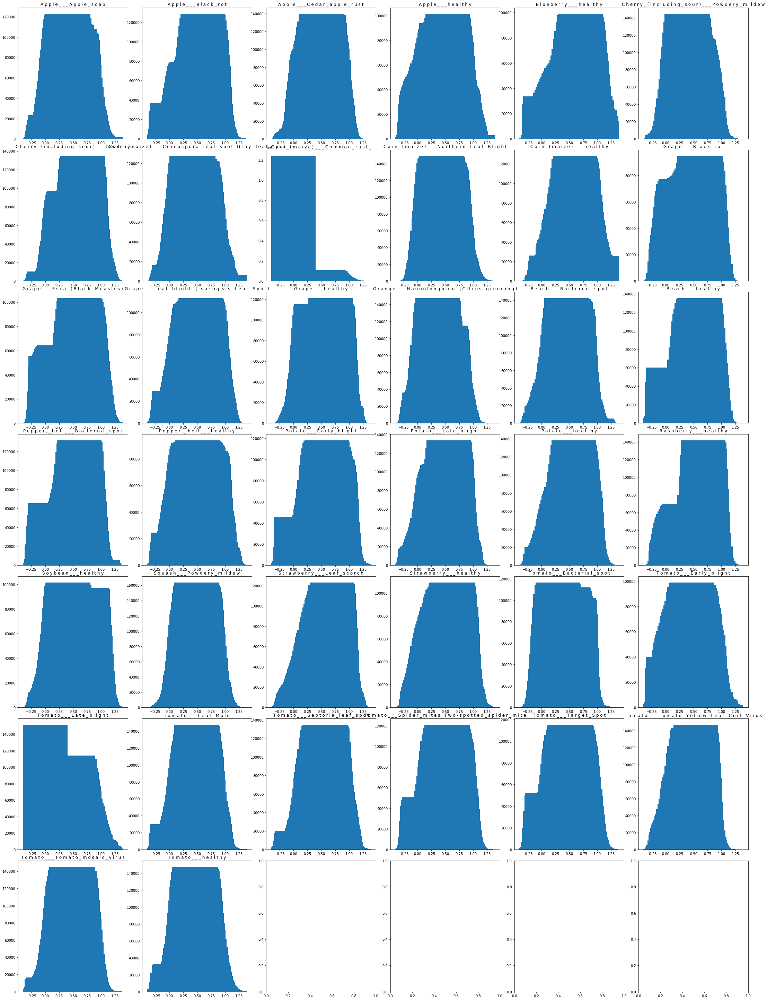

In [16]:
transform = transforms.Compose([transforms.Grayscale(), transforms.ToTensor()])
img_dataset = datasets.ImageFolder(IMAGE_DIR, transform=transform)

ROWS = 7
COLS = 6
j = 0 

fig, axes = plt.subplots(figsize=(30,40), nrows=ROWS, ncols=COLS)
fig.tight_layout() 

dirs = os.listdir(IMAGE_DIR)
if '.DS_Store' in dirs:
    dirs.remove('.DS_Store')

for k, d in enumerate(sorted(dirs)):
    k = k%COLS
    idx = [i for i in range(len(img_dataset)) if img_dataset.imgs[i][1] == img_dataset.class_to_idx[d]]
    img_subset = Subset(img_dataset, idx)
    img_loader = DataLoader(dataset=img_subset, batch_size=BATCH_SIZE, shuffle=True)
    data = iter(img_loader).next()
    image, label = data
    x = torch.histogram(image.squeeze().view(BATCH_SIZE*image.shape[-1]*image.shape[-2]), range=(0., 1.))
    bins = x[1]
    axes[j][k].bar(bins[:-1],x[0])
    axes[j][k].title.set_text(' '.join('%5s' % d ))
    j = j + 1 if k == COLS-1 else j

### Average Pixel Distribution

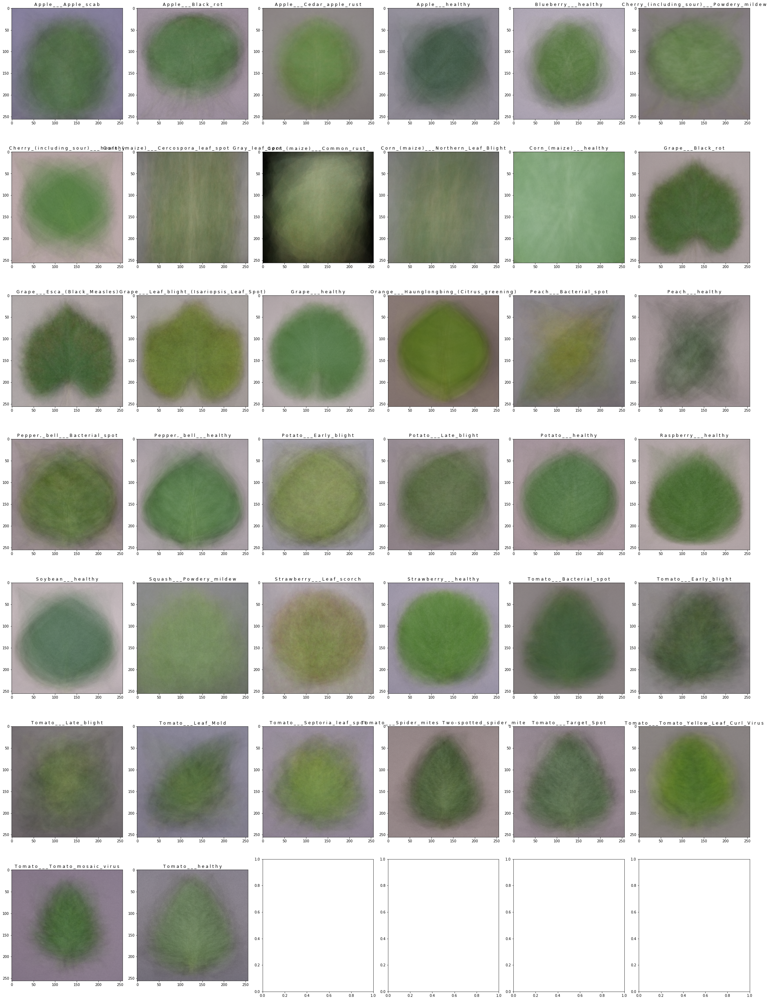

In [17]:
transform = transforms.Compose([transforms.ToTensor()])
img_dataset = datasets.ImageFolder(IMAGE_DIR, transform=transform)

ROWS = 7
COLS = 6
j = 0 

fig, axes = plt.subplots(figsize=(30,40), nrows=ROWS, ncols=COLS)
fig.tight_layout() 

image_mean ={}
dirs = os.listdir(IMAGE_DIR)
if '.DS_Store' in dirs:
    dirs.remove('.DS_Store')

for k, d in enumerate(sorted(dirs)):
    k = k%COLS
    idx = [i for i in range(len(img_dataset)) if img_dataset.imgs[i][1] == img_dataset.class_to_idx[d]]
    img_subset = Subset(img_dataset, idx)
    img_loader = DataLoader(dataset=img_subset, batch_size=BATCH_SIZE, shuffle=True)
    data = iter(img_loader).next()
    image, label = data
    image_mean[d] = torch.mean(image, dim = [0])
    axes[j][k].imshow(image_mean[d].permute(1,2,0))
    axes[j][k].title.set_text(' '.join('%5s' % d ))
    j = j + 1 if k == COLS-1 else j

### Contrast Between Images

In [18]:
ref = {'Apple___healthy': ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust']
       ,'Blueberry___healthy':['Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy']
       ,'Corn_(maize)___healthy': ['Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight']
       ,'Grape___healthy': ['Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)']
       #,'Orange___Haunglongbing_(Citrus_greening)':[]
       ,'Peach___healthy':['Peach___Bacterial_spot']
       ,'Pepper,_bell___healthy':['Pepper,_bell___Bacterial_spot']
       ,'Potato___healthy': ['Potato___Early_blight', 'Potato___Late_blight']
       #,'Raspberry___healthy': []
       #,'Soybean___healthy': []
       #,'Squash___Powdery_mildew': []
       ,'Strawberry___healthy': ['Strawberry___Leaf_scorch']
       ,'Tomato___healthy': ['Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Tomato_mosaic_virus']
      }

In [19]:
image_mean['Tomato___healthy'].min()

tensor(0.2555)

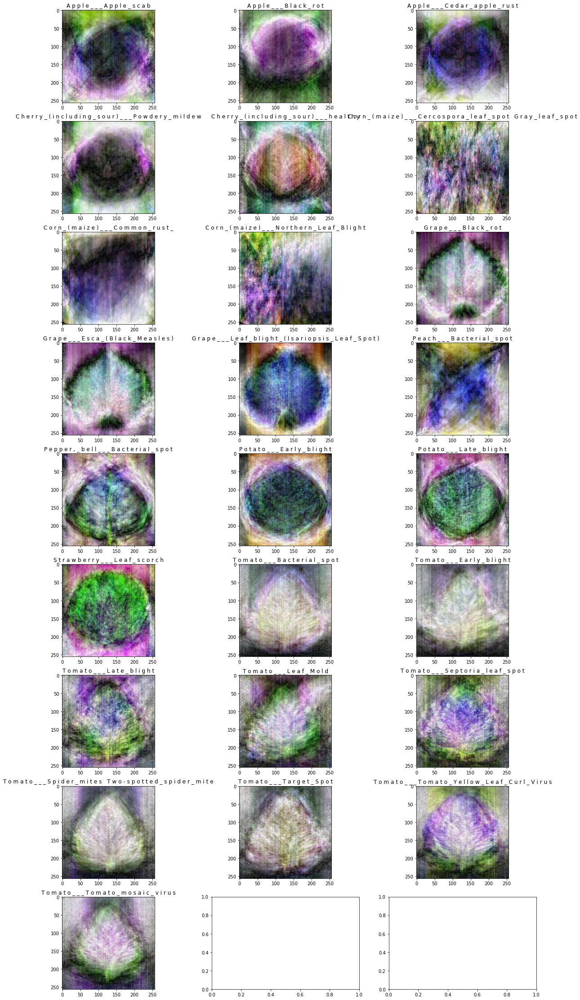

In [20]:
i = 0
j = 0
fig, axes = plt.subplots(figsize=(20,40), nrows=9, ncols=3)
for key, value in ref.items():
    if len(value) > 0:
        for item in value:
            j = j%3
            x = (image_mean[key] - image_mean[item]) * 10
            x -= x.min(1, keepdim=True)[0] # return first minimal value if more than one match
            x /= x.max(1, keepdim=True)[0]
            axes[i][j].imshow(x.permute(1,2,0))
            axes[i][j].title.set_text(' '.join('%5s' % item ))
            j += 1
            i = i+1 if j == 3 else i